## Titanic's survival prediction

Predicting survival from one of the most well known shipwrecks in world history.


#### D2APR: Aprendizado de Máquina e Reconhecimento de Padrões (IFSP, Campinas)
**Prof**: Samuel Martins (Samuka)

**Study Project**
**Students**: Carlos Danilo Tomé e Lucas Galdino de Camargo

**Dataset**: https://www.kaggle.com/c/titanic/overview

## 1. Framing the Problem


#### 1.1 The Challenge
The sinking of the Titanic is one of the most infamous shipwrecks in history.

On April 15, 1912, during her maiden voyage, the widely considered “unsinkable” RMS Titanic sank after colliding with an iceberg. Unfortunately, there weren’t enough lifeboats for everyone onboard, resulting in the death of 1502 out of 2224 passengers and crew.

While there was some element of luck involved in surviving, it seems some groups of people were more likely to survive than others.

In this challenge, we ask you to build a predictive model that answers the question: “what sorts of people were more likely to survive?” using passenger data (ie name, age, gender, socio-economic class, etc).


#### 1.2 What Data Will I Use in This Competition?
In this competition, you’ll gain access to two similar datasets that include passenger information like name, age, gender, socio-economic class, etc. One dataset is titled `train.csv` and the other is titled `test.csv`.

Train.csv will contain the details of a subset of the passengers on board (891 to be exact) and importantly, will reveal whether they survived or not, also known as the “ground truth”.

The `test.csv` dataset contains similar information but does not disclose the “ground truth” for each passenger. It’s your job to predict these outcomes.

Using the patterns you find in the train.csv data, predict whether the other 418 passengers on board (found in test.csv) survived.

Check out the “Data” tab to explore the datasets even further. Once you feel you’ve created a competitive model, submit it to Kaggle to see where your model stands on our leaderboard against other Kagglers.

#### 1.3 Goal
It is our job to predict if a passenger survived the sinking of the Titanic or not.
For each in the test set, we must predict a 0 or 1 value for the variable.

#### 1.4 Metric
The score for this competittion is the percentage of passengers we correctly predict. This is known as accuracy.


#### 1.5 Submission File Format
You should submit a csv file with exactly 418 entries plus a header row. Your submission will show an error if you have extra columns (beyond PassengerId and Survived) or rows.

The file should have exactly 2 columns:

    - PassengerId (sorted in any order)
    - Survived (contains your binary predictions: 1 for survived, 0 for deceased)
    
    
#### 1.6 Overview
The data has been split into two groups:

    - training set (train.csv)
    - test set (test.csv)
    
The training set should be used to build your machine learning models. For the training set, we provide the outcome (also known as the “ground truth”) for each passenger. Your model will be based on “features” like passengers’ gender and class. You can also use feature engineering to create new features.

The test set should be used to see how well your model performs on unseen data. For the test set, we do not provide the ground truth for each passenger. It is your job to predict these outcomes. For each passenger in the test set, use the model you trained to predict whether or not they survived the sinking of the Titanic.

We also include gender_submission.csv, a set of predictions that assume all and only female passengers survive, as an example of what a submission file should look like.


#### 1.7 Data Dictionary

| Variable | Definition | Key | 
|---|---|---|
| survival | Survival | 0 = No, 1 = Yes | 
| pclass | Ticket class | 1 = 1st, 2 = 2nd, 3 = 3rd |  
| sex | Sex |   |   
| Age | Age in years |  |
| sibsp | # of siblings / spouses aboard the Titanic |  |
| parch | # of parents / children aboard the Titanic |  |
| ticket | Ticket number |  |
| fare | Passenger fare |  |
| cabin | Cabin number | |
| embarked | Port of Embarkation | C = Cherbourg, Q = Queenstown, S = Southampton |


#### 1.8 Variable Notes

**pclass**: A proxy for socio-economic status (SES)
   - 1st = Upper
   - 2nd = Middle
   - 3rd = Lower

**age**: Age is fractional if less than 1. If the age is estimated, is it in the form of xx.5

**sibsp**: The dataset defines family relations in this way...
   - Sibling = brother, sister, stepbrother, stepsister
   - Spouse = husband, wife (mistresses and fiancés were ignored)

**parch**: The dataset defines family relations in this way...
   - Parent = mother, father
   - Child = daughter, son, stepdaughter, stepson
   - Some children travelled only with a nanny, therefore parch=0 for them.

### 2. Imports

In [133]:
import pandas as pd
import numpy as np
import string
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mode
from pandas_profiling import ProfileReport
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix, precision_recall_curve, roc_curve, auc, log_loss, plot_confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.base import BaseEstimator, TransformerMixin
import joblib

from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

sns.set_theme(style="whitegrid")

params = {'legend.fontsize': 'x-large',
          'figure.figsize': (15, 5),
          'axes.labelsize': 'x-large',
          'axes.titlesize':'x-large',
          'xtick.labelsize':'x-large',
          'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

# Reading the datasets
train = pd.read_csv('./datasets/train.csv')
submission_test = pd.read_csv('./datasets/test.csv')
gender_submission = pd.read_csv('./datasets/gender_submission.csv')

### 3. Exploratory Data Analysis

In [2]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [3]:
train.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [4]:
# Let's take a look at the survivalness rate
train['Survived'].value_counts(normalize=True)

0    0.616162
1    0.383838
Name: Survived, dtype: float64

#### 3.1 Checking for missing values

We have a lot of missing values for the attribute **Cabin**, so let's take a lot at that!
   - It seems that the Cabin attribute is strongly related either to Pclass (and consequently also related within the Fare paid) and to survivalness rate.
   - Maybe we could create a binary column considering if the person was in a Cabin or not.

Another attribute we've a lot of missings is the **Age**.
   - In order to deal with that, we'll guard some statistics about this dataset to replace these missing values latter.
   - As the social status and the Pclass are related within the Age, we'll use these 2 attributes to aggregate the mean age, and that's what we're using to do the missing replacements.
   
Finally, we also have missing values for the attribute **Embarked**.
   - That's not a big deal, once we have only 2 missing values.
   - We'll replace these missing values with the mode (most common value) of this attribute.

In [5]:
train.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [6]:
train[train['Cabin'].isnull() == False].describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,204.000000,204.000000,204.000000,185.000000,204.000000,204.000000,204.000000
mean,455.401961,0.666667,1.196078,35.829297,0.441176,0.436275,76.141504
std,251.379279,0.472564,0.525961,15.679356,0.628918,0.729976,74.391749
min,2.000000,0.000000,1.000000,0.920000,0.000000,0.000000,0.000000
25%,261.750000,0.000000,1.000000,24.000000,0.000000,0.000000,29.453125
50%,457.500000,1.000000,1.000000,36.000000,0.000000,0.000000,55.220850
75%,684.000000,1.000000,1.000000,48.000000,1.000000,1.000000,89.328150
max,890.000000,1.000000,3.000000,80.000000,3.000000,4.000000,512.329200


In [7]:
train[train['Cabin'].isnull() == True].describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,687.000000,687.000000,687.000000,529.000000,687.000000,687.000000,687.000000
mean,443.208151,0.299854,2.639010,27.555293,0.547307,0.365357,19.157325
std,259.215905,0.458528,0.589602,13.472634,1.207492,0.827106,28.663343
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,214.500000,0.000000,2.000000,19.000000,0.000000,0.000000,7.877100
50%,441.000000,0.000000,3.000000,26.000000,0.000000,0.000000,10.500000
75%,664.500000,1.000000,3.000000,35.000000,1.000000,0.000000,23.000000
max,891.000000,1.000000,3.000000,74.000000,8.000000,6.000000,512.329200


Let's take a look at the **Fare** attribute.

Well, we've 15 observations in the train set were the Fare is equal to zero.

This could be considered as missing values, but we won't replace them. 

In [8]:
train['Fare'].describe()

count    891.000000
mean      32.204208
std       49.693429
min        0.000000
25%        7.910400
50%       14.454200
75%       31.000000
max      512.329200
Name: Fare, dtype: float64

In [9]:
train[train['Fare'] == 0]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
179,180,0,3,"Leonard, Mr. Lionel",male,36.0,0,0,LINE,0.0,NaN,S
263,264,0,1,"Harrison, Mr. William",male,40.0,0,0,112059,0.0,B94,S
271,272,1,3,"Tornquist, Mr. William Henry",male,25.0,0,0,LINE,0.0,NaN,S
277,278,0,2,"Parkes, Mr. Francis ""Frank""",male,NaN,0,0,239853,0.0,NaN,S
302,303,0,3,"Johnson, Mr. William Cahoone Jr",male,19.0,0,0,LINE,0.0,NaN,S
413,414,0,2,"Cunningham, Mr. Alfred Fleming",male,NaN,0,0,239853,0.0,NaN,S
466,467,0,2,"Campbell, Mr. William",male,NaN,0,0,239853,0.0,NaN,S
481,482,0,2,"Frost, Mr. Anthony Wood ""Archie""",male,NaN,0,0,239854,0.0,NaN,S
597,598,0,3,"Johnson, Mr. Alfred",male,49.0,0,0,LINE,0.0,NaN,S
633,634,0,1,"Parr, Mr. William Henry Marsh",male,NaN,0,0,112052,0.0,NaN,S


In [10]:
train[train['Fare'] != 0].describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,876.000000,876.000000,876.000000,707.000000,876.000000,876.000000,876.000000
mean,444.794521,0.389269,2.315068,29.645219,0.531963,0.388128,32.755650
std,257.806393,0.487863,0.835663,14.558872,1.110009,0.811374,49.936826
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,4.012500
25%,220.750000,0.000000,2.000000,20.000000,0.000000,0.000000,7.925000
50%,444.500000,0.000000,3.000000,28.000000,0.000000,0.000000,14.500000
75%,667.250000,1.000000,3.000000,38.000000,1.000000,0.000000,31.275000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


In [11]:
train[train['Fare'] == 0].describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,15.000000,15.000000,15.000000,7.000000,15.0,15.0,15.0
mean,516.400000,0.066667,1.933333,35.142857,0.0,0.0,0.0
std,225.808958,0.258199,0.798809,10.023781,0.0,0.0,0.0
min,180.000000,0.000000,1.000000,19.000000,0.0,0.0,0.0
25%,290.500000,0.000000,1.000000,30.500000,0.0,0.0,0.0
50%,482.000000,0.000000,2.000000,38.000000,0.0,0.0,0.0
75%,704.000000,0.000000,2.500000,39.500000,0.0,0.0,0.0
max,823.000000,1.000000,3.000000,49.000000,0.0,0.0,0.0


#### 3.2 Data Cleaning and creation of new features

In [12]:
# Getting the Lastname
names = train['Name'].str.split(",", n=1, expand = True)

train['lastname'] = names[0]
train['Name'] = names[1]

# Getting the person's status/title 
names = train['Name'].str.strip().str.split(".", n=1, expand = True)
train['status'] = names[0]
train.drop('Name',axis=1,inplace=True)

# Getting the size of the family on board
train['family_members'] = train['SibSp'] + train['Parch'] + 1

# Getting the ticket's fare unitary (per person)
train['unitary_fare'] = train['Fare']/train['family_members']

# Getting just the information about the Cabin Area
train['Cabin'] = train.Cabin.str.slice(0,1,1)

# Replacing NA Cabin values for U (Unknown)
train['Cabin'] = train.Cabin.fillna('U')

# Replacing NA Embarked values with the mode of Embarked attribute
train['Embarked'] = train.Embarked.fillna(mode(train['Embarked'])[0][0])

# Getting just the first element of the Ticket
train['Ticket'] = train.Ticket.str.slice(0,1,1)

train.head()

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,lastname,status,family_members,unitary_fare
0,1,0,3,male,22.0,1,0,A,7.2500,U,S,Braund,Mr,2,3.62500
1,2,1,1,female,38.0,1,0,P,71.2833,C,C,Cumings,Mrs,2,35.64165
2,3,1,3,female,26.0,0,0,S,7.9250,U,S,Heikkinen,Miss,1,7.92500
3,4,1,1,female,35.0,1,0,1,53.1000,C,S,Futrelle,Mrs,2,26.55000
4,5,0,3,male,35.0,0,0,3,8.0500,U,S,Allen,Mr,1,8.05000


In [13]:
status = train.groupby(['status']).apply(lambda x: pd.Series(dict(title_count = ((x.Survived.count()))
                                                                    ,survived = ((x.Survived.sum()))
                                                                    ,survival_perc = ((x.Survived.sum()*100/x.Survived.count()))
))).reset_index()

status.sort_values(by='survival_perc',ascending=False)

,status,title_count,survived,survival_perc
16,the Countess,1.0,1.0,100.000000
9,Mlle,2.0,2.0,100.000000
15,Sir,1.0,1.0,100.000000
13,Ms,1.0,1.0,100.000000
5,Lady,1.0,1.0,100.000000
10,Mme,1.0,1.0,100.000000
12,Mrs,125.0,99.0,79.200000
8,Miss,182.0,127.0,69.780220
7,Master,40.0,23.0,57.500000
1,Col,2.0,1.0,50.000000


In [14]:
def resume_status(df):
    status = df['status']
    
    if df['Sex'] == 'male':
        if status in ['Master','Col','Major','Dr']:
            return 'Other'
        else:
            return 'Mr'
    else:     
        if status in ['Mlle', 'Ms', 'Miss']:
            return 'Miss'
        else:
            return 'Mrs'       

# applying the function to deal with the status
train['new_status']= train.apply(resume_status, axis=1)

# dropping columns we won't need anymore
train.drop(['lastname','status'],axis=1,inplace=True)

# Viewing some stats from the new_status 
status = train.groupby(['new_status']).apply(lambda x: pd.Series(dict(title_count = ((x.Survived.count()))
                                                                    ,survived = ((x.Survived.sum()))
                                                                    ,survival_perc = ((x.Survived.sum()*100/x.Survived.count()))
))).reset_index()

status.sort_values(by='survival_perc',ascending=False)

,new_status,title_count,survived,survival_perc
2,Mrs,129.0,103.0,79.844961
0,Miss,185.0,130.0,70.270270
3,Other,50.0,27.0,54.000000
1,Mr,527.0,82.0,15.559772


In [15]:
# creating the dataframe we'll use to deal with mising values within the Age feature
age_info = train.groupby(['Pclass','new_status']).apply(lambda x: pd.Series(dict(persons_count = ((x.Survived.count()))
                                                                    ,survived = ((x.Survived.sum()))
                                                                    ,survival_perc = ((x.Survived.sum()*100/x.Survived.count()))
                                                                    ,mean_age = ((np.round(x.Age.mean(),0)))
                                                                    ,median_age = ((np.round(x.Age.median(),0)))
))).reset_index()

# age_info.to_csv('../working/age_info.csv', sep=';',index=False)
age_info.to_csv('./datasets/age_info.csv', sep=';',index=False)  
    
age_info.sort_values(by='survival_perc',ascending=False)

,Pclass,new_status,persons_count,survived,survival_perc,mean_age,median_age
2,1,Mrs,46.0,45.0,97.826087,41.0,42.0
0,1,Miss,48.0,46.0,95.833333,30.0,30.0
4,2,Miss,35.0,33.0,94.285714,23.0,24.0
6,2,Mrs,41.0,37.0,90.243902,34.0,32.0
7,2,Other,11.0,9.0,81.818182,9.0,2.0
3,1,Other,11.0,7.0,63.636364,35.0,44.0
8,3,Miss,102.0,51.0,50.000000,16.0,18.0
10,3,Mrs,42.0,21.0,50.000000,34.0,31.0
11,3,Other,28.0,11.0,39.285714,5.0,4.0
1,1,Mr,111.0,38.0,34.234234,42.0,40.0


In [16]:
# Read the age info to substitute missing values
age_info = pd.read_csv('./datasets/age_info.csv',sep=';')
age = age_info[['Pclass','new_status','mean_age']].copy()

# left join to get mean_age
train = train.merge(age, how='left', on=['Pclass','new_status'])
# replacing null values for the mean_age giving the Pclass and new_status
train.Age = np.where(train.Age.isnull(), train.mean_age, train.Age) 

# Dropping mean_age, which we won't need anymore
train.drop('mean_age',axis=1,inplace=True) 

In [17]:
def age_solving(df):
       
    # Defining the age_class
    age = df['Age']
    
    if age <= 10:
        return 'child'
    elif age <= 18:
        return 'teen'
    elif age <= 60:
        return 'adult'
    else:     
        return 'senior'      

In [18]:
# Applying the function to deal with missing values in Age and create the age_class
train['age_class']= train.apply(age_solving, axis=1)

# Viewing some stats from the age_class created
age_class = train.groupby(['age_class']).apply(lambda x: pd.Series(dict(title_count = ((x.Survived.count()))
                                                                    ,survived = ((x.Survived.sum()))
                                                                    ,survival_perc = ((x.Survived.sum()*100/x.Survived.count()))
))).reset_index()

age_class.sort_values(by='survival_perc',ascending=False)

,age_class,title_count,survived,survival_perc
1,child,68.0,40.0,58.823529
3,teen,108.0,51.0,47.222222
0,adult,693.0,246.0,35.497835
2,senior,22.0,5.0,22.727273


In [19]:
def fml_clss(df):
    # Defining the family_class
    family = df['family_members']
    
    if family == 1:
        return 'alone'
    elif family <= 4:
        return 'small family'
    else:     
        return 'big family'  

In [20]:
# Applying the function to create the family class
train['family_class']= train.apply(fml_clss, axis=1)

# Viewing some stats from the family_class created
family_class = train.groupby(['family_class']).apply(lambda x: pd.Series(dict(title_count = ((x.Survived.count()))
                                                                    ,survived = ((x.Survived.sum()))
                                                                    ,survival_perc = ((x.Survived.sum()*100/x.Survived.count()))
))).reset_index()

family_class.sort_values(by='survival_perc',ascending=False)

,family_class,title_count,survived,survival_perc
2,small family,292.0,169.0,57.876712
0,alone,537.0,163.0,30.353818
1,big family,62.0,10.0,16.129032


In [21]:
sex = train.groupby(['Sex']).apply(lambda x: pd.Series(dict(count = ((x.Survived.count()))
                                                                    ,survived = ((x.Survived.sum()))
                                                                    ,survival_perc = ((x.Survived.sum()*100/x.Survived.count()))
))).reset_index()

sex.sort_values(by='survival_perc',ascending=False)

,Sex,count,survived,survival_perc
0,female,314.0,233.0,74.203822
1,male,577.0,109.0,18.890815


In [22]:
cabin = train.groupby(['Cabin']).apply(lambda x: pd.Series(dict(count = ((x.Survived.count()))
                                                                    ,survived = ((x.Survived.sum()))
                                                                    ,survival_perc = ((x.Survived.sum()*100/x.Survived.count()))
))).reset_index()

cabin.sort_values(by='survival_perc',ascending=False)

,Cabin,count,survived,survival_perc
3,D,33.0,25.0,75.757576
4,E,32.0,24.0,75.000000
1,B,47.0,35.0,74.468085
5,F,13.0,8.0,61.538462
2,C,59.0,35.0,59.322034
6,G,4.0,2.0,50.000000
0,A,15.0,7.0,46.666667
8,U,687.0,206.0,29.985444
7,T,1.0,0.0,0.000000


In [23]:
embarked = train.groupby(['Embarked']).apply(lambda x: pd.Series(dict(title_count = ((x.Survived.count()))
                                                                    ,survived = ((x.Survived.sum()))
                                                                    ,survival_perc = ((x.Survived.sum()*100/x.Survived.count()))
))).reset_index()

embarked.sort_values(by='survival_perc',ascending=False)

,Embarked,title_count,survived,survival_perc
0,C,168.0,93.0,55.357143
1,Q,77.0,30.0,38.961039
2,S,646.0,219.0,33.900929


In [24]:
ticket = train.groupby(['Ticket']).apply(lambda x: pd.Series(dict(count = ((x.Survived.count()))
                                                                    ,survived = ((x.Survived.sum()))
                                                                    ,fare_mean = ((x.Fare.mean()))
                                                                    ,survival_perc = ((x.Survived.sum()*100/x.Survived.count()))
))).reset_index()

ticket.sort_values(by='count',ascending=False)

,Ticket,count,survived,fare_mean,survival_perc
2,3,301.0,72.0,15.969611,23.920266
1,2,183.0,85.0,19.903349,46.448087
0,1,146.0,92.0,62.126797,63.013699
13,P,65.0,42.0,114.085831,64.615385
14,S,65.0,21.0,17.347822,32.307692
10,C,47.0,16.0,28.335462,34.042553
9,A,29.0,2.0,9.975286,6.896552
15,W,13.0,2.0,32.817308,15.384615
3,4,10.0,2.0,15.893770,20.000000
6,7,9.0,1.0,9.367133,11.111111


#### 3.3 Data visualization

In [25]:
train.head()

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,family_members,unitary_fare,new_status,age_class,family_class
0,1,0,3,male,22.0,1,0,A,7.2500,U,S,2,3.62500,Mr,adult,small family
1,2,1,1,female,38.0,1,0,P,71.2833,C,C,2,35.64165,Mrs,adult,small family
2,3,1,3,female,26.0,0,0,S,7.9250,U,S,1,7.92500,Miss,adult,alone
3,4,1,1,female,35.0,1,0,1,53.1000,C,S,2,26.55000,Mrs,adult,small family
4,5,0,3,male,35.0,0,0,3,8.0500,U,S,1,8.05000,Mr,adult,alone


Text(0.5, 1.0, 'Unitary Fare')

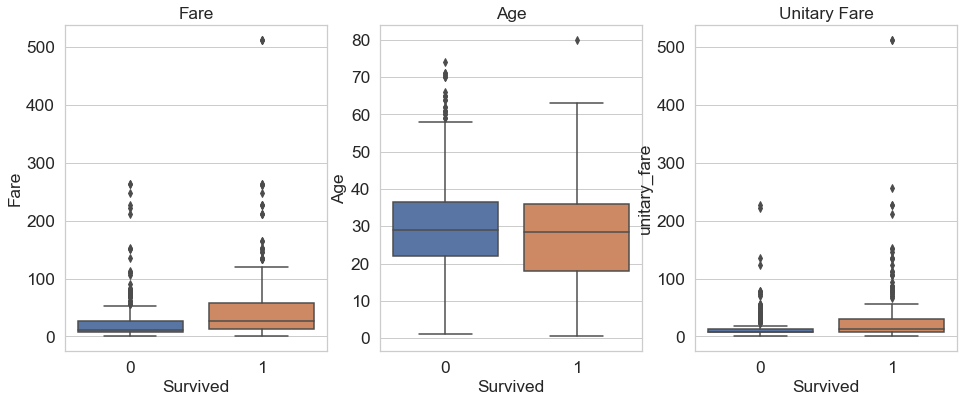

In [26]:
fig, axes = plt.subplots(1, 3, figsize=(16, 6))

sns.boxplot(data=train, y="Fare", x="Survived", ax=axes[0]).set(xlabel="Survived")
axes[0].set_title('Fare')

sns.boxplot(data=train, y="Age", x="Survived", ax=axes[1]).set(xlabel="Survived")
axes[1].set_title('Age')

sns.boxplot(data=train, y="unitary_fare", x="Survived", ax=axes[2]).set(xlabel="Survived")
axes[2].set_title('Unitary Fare')

Text(0.5, 1.0, "Family's size")

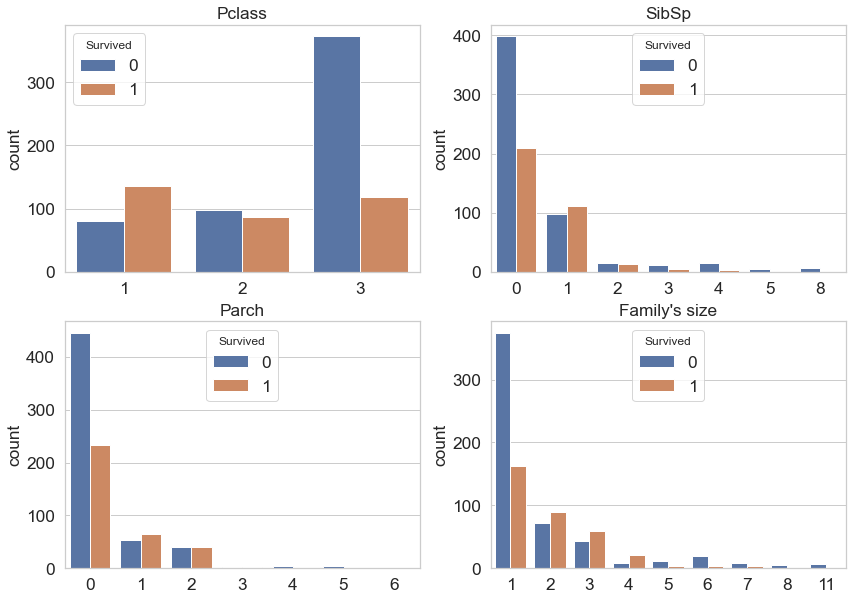

In [27]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

sns.countplot(x="Pclass", hue="Survived", data=train, ax=axes[0,0]).set(xlabel=None)
axes[0,0].set_title('Pclass')

sns.countplot(x="SibSp", hue="Survived", data=train, ax=axes[0,1]).set(xlabel=None)
axes[0,1].set_title('SibSp')

sns.countplot(x="Parch", hue="Survived", data=train, ax=axes[1,0]).set(xlabel=None)
axes[1,0].set_title('Parch')

sns.countplot(x="family_members", hue="Survived", data=train, ax=axes[1,1]).set(xlabel=None)
axes[1,1].set_title("Family's size")

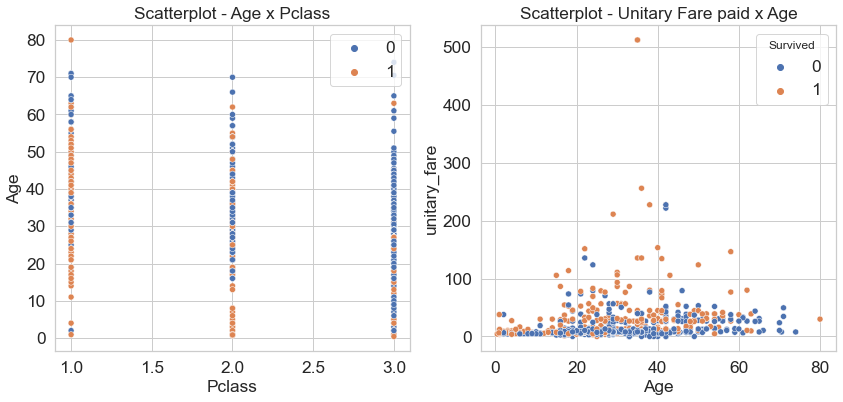

In [28]:
##### HUE of survivalness by Age x Pclass and unitary_fare x Age
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(y="Age", x='Pclass', data=train, hue ='Survived',  ax=axes[0], color = 'tab:blue').legend(loc='upper right')
axes[0].set_title('Scatterplot - Age x Pclass')

sns.scatterplot(y="unitary_fare", x='Age', data=train, hue ='Survived',  ax=axes[1], color = 'tab:orange')
axes[1].set_title('Scatterplot - Unitary Fare paid x Age');

#### 3.4 Profile Report

In [29]:
# profile = ProfileReport(train, title="Pandas Profiling Report - Titanic", explorative=True)
profile = ProfileReport(train, title="Pandas Profiling Report - Titanic")
profile

### 4. Modelling

#### 4.1 Creating a preprocessing transformer

In [86]:
class pre_processing_transform(BaseEstimator, TransformerMixin):
    
    # class that creates the new variables
    # class that deals with the outliers in the coordinates
    # class that substitutes the District by its created hierarchical class considering its mean price per square meter
    # Goal: customized transformator to consider in the pipeline as well as adapted to sklearn
    # notes: with this configuration this class is able to do "fit", "transform" and "fit_transform", natives on sklearn
    
    def __init__(self,age_sub='mean_age'):
        self.age_sub = age_sub
        return None
    
    def fit(self,X,y = None):
        return self
    
    def resume_status(df):
        # treating the status feature
        status = df['status']

        if df['Sex'] == 'male':
            if status in ['Master','Col','Major','Dr']:
                return 'Other'
            else:
                return 'Mr'
        else:     
            if status in ['Mlle', 'Ms', 'Miss']:
                return 'Miss'
            else:
                return 'Mrs'       

    def age_solving(df):
        # Defining the age_class
        age = df['Age']

        if age <= 10:
            return 'child'
        elif age <= 18:
            return 'teen'
        elif age <= 60:
            return 'adult'
        else:     
            return 'senior'          

    def fml_clss(df):
        # Defining the family_class
        family = df['family_members']

        if family == 1:
            return 'alone'
        elif family <= 4:
            return 'small family'
        else:     
            return 'big family' 

    def transform(self, X, y = None):
        df = X.copy()        

        # Getting the person's status/title 
        names = df['Name'].str.split(",", n=1, expand = True)
        df['Name'] = names[1]
        names = df['Name'].str.strip().str.split(".", n=1, expand = True)
        df['status'] = names[0]

        # applying the function to deal with the status
        df['new_status']= df.apply(resume_status, axis=1)

        # Read the age info to substitute missing values
        age_info = pd.read_csv('./datasets/age_info.csv',sep=';')
        age = age_info[['Pclass','new_status',self.age_sub]].copy()

        # left join to get mean_age
        df = df.merge(age, how='left', on=['Pclass','new_status'])
        # replacing null values for the mean_age giving the Pclass and new_status
        df.Age = np.where(df.Age.isnull(), df[self.age_sub], df.Age) 

        # Applying the function to deal with missing values in Age and create the age_class
        df['age_class']= df.apply(age_solving, axis=1)    

        # Getting the size of the family on board
        df['family_members'] = df['SibSp'] + df['Parch'] + 1

        # Getting the ticket's fare unitary (per person)
        # df['unitary_fare'] = df['Fare']/df['family_members']

        # Applying the function to create the family class
        df['family_class']= df.apply(fml_clss, axis=1)    

        # Replacing NA Cabin values for U (Unknown)
        df['Cabin'] = df.Cabin.isnull()
        df['Cabin'] = df['Cabin'].replace([True,False],[1,0])

        # Replacing NA Embarked values with the mode of Embarked attribute
        df['Embarked'] = df.Embarked.fillna('S')  

        df['female'] = df['Sex'].replace(['male','female'],[0,1])
        
        # dropping columns we won't need anymore
        df.drop(['PassengerId','Name','status','Ticket','Sex',self.age_sub],axis=1,inplace=True)    

        # Transforming our categorical variables into dummy variables
        df = pd.get_dummies(data=df,columns=['Embarked','new_status','age_class','family_class'],drop_first=True)            
        
        # print(df.dtypes)
        
        return df

In [87]:
# Reading the datasets
train = pd.read_csv('./datasets/train.csv')
submission_test = pd.read_csv('./datasets/test.csv')

# Splitting the data between train and test
train, test = train_test_split(train, test_size=0.2, stratify=train['Sex'], random_state=42)

# Saving the data after split
train.to_csv('./datasets/train_set.csv', sep=';',index=False)
test.to_csv('./datasets/test_set.csv', sep=';',index=False)

In [88]:
# Importing our Train set and splitting it into features (X_train) and target (y_train)

# Loading trainning data
train = pd.read_csv('./datasets/train_set.csv', sep=';')

X_train = train.drop(['Survived'], axis=1).copy()
y_train = train['Survived'].copy()

# Importing Test set and split it into features (X_train) and target (y_train)

# Loading testing data
test = pd.read_csv('./datasets/test_set.csv', sep=';')

X_test = test.drop(['Survived'], axis=1).copy()
y_test = test['Survived'].copy()

# Loading the data to submission
X_submission_test = pd.read_csv('./datasets/submission_test.csv', sep=';')

#### 4.2 Defining our pipelines

In [89]:
pipeline = Pipeline([
        
    #Data preprocessing
    ('Criando as colunas', pre_processing_transform()),
    # Scaling our data with StandardScaler
    ('escalonando', StandardScaler())
])

In [90]:
pipeline2 = Pipeline([
        
    #Data preprocessing
    ('Criando as colunas', pre_processing_transform(age_sub='median_age')),
    # Scaling our data with StandardScaler
    ('escalonando', StandardScaler())
])

In [91]:
# Fit and Apply the Pipeline
X_train_transformed = pipeline.fit_transform(X_train)

In [92]:
X_train_transformed.shape

(712, 18)

In [93]:
# Saving Pipeline
joblib.dump(pipeline, '../preprocessed_pipeline.pkl')

['../preprocessed_pipeline.pkl']

In [94]:
# Fit and Apply the Pipeline
X_train_transformed2 = pipeline2.fit_transform(X_train)

In [95]:
X_train_transformed2.shape

(712, 18)

In [96]:
# Saving Pipeline
joblib.dump(pipeline2, '../preprocessed_pipeline2.pkl')

['../preprocessed_pipeline2.pkl']

#### 4.3 Models and Metrics

##### 4.3.1 Models

In order to solve this classification problem, we'll try the following models:

   - Logistic Regression
   - Decision Tree 
   - Random Forest
   - Extra Trees
   - Naive Bayes
   - Support Vector Classifier
   - Ridge Classifier
   - AdaBoost Classifier

   
##### 4.3.2 Metrics

We'll use the **accuracy** score to evaluate our models.

We'll also plot the confusion matrix as well as print the precision and recall for the train and test sets, in order to understand our models better.

Above we list the definition of each metric we'll show when evaluating our models:

- TP: True Positive - Observations predicted as positive where the real class is negative
- TN: True Negative - Observations predicted as negative where the real class is negative
- FP: False Positive - Observations predicted as positive where the real class is negative
- FN: False Negative - Observations predicted as negative where the real class is positive


- T: Total: T = TP + FN + FP + TN


- accuracy = (TP + TN) / T
- precision = TP / (TP + FP)
- recall = TP / (TP + FN)

#### 4.4 Modelling and evaluating

In [97]:
# Function to plot the confusion matrix as well as the ROC curve in the test set 
# This function also prints the accuracy, f1, precision and recall scores, both for the train and test sets
def classification_results(modelo, nome_do_modelo):  

    # Getting the predictions
    y_train_pred = np.nan
    y_train_pred = modelo.predict(X_train)
    y_test_pred = np.nan
    y_test_pred = modelo.predict(X_test)    
    if nome_do_modelo != 'Ridge Classifier':
        y_pred_proba = modelo.predict_proba(X_test)[:, 1]       
    
    # Printing the model's name
    print(f'RESULTS of {nome_do_modelo} \n') 
    
    # Computing the metrics in the TRAIN SET
    accuracy  =  accuracy_score(y_train,y_train_pred)
    f1        =  f1_score(y_train, y_train_pred) 
    precision  =  precision_score(y_train, y_train_pred)
    recall    =  recall_score(y_train,y_train_pred)

    print('Results in the TRAIN set:')
    print('Accuracy                     : ', round(accuracy*100, 2) , '%'  )
    print('F1 Score                     : ', round(f1*100, 2)        , '%'  )
    print('Precision                    : ', round(precision*100, 2)  , '%' )
    print('Recall                       : ', round(recall*100 , 2)   , '%'  )   
    print('\n')
    
    # Computing the metrics in the TEST SET
    accuracy_test  =  accuracy_score(y_test,y_test_pred)
    f1_test        =  f1_score(y_test, y_test_pred) 
    precision_test  =  precision_score(y_test, y_test_pred)
    recall_test    =  recall_score(y_test,y_test_pred)

    print('Results in the TEST set:')
    print('Accuracy                     : ', round(accuracy_test*100, 2) , '%'  )
    print('F1 Score                     : ', round(f1_test*100, 2)        , '%'  )
    print('Precision                    : ', round(precision_test*100, 2)  , '%' )
    print('Recall                       : ', round(recall_test*100 , 2)   , '%'  )
    print('\n')
    
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))

    # Confusion Matrix in the TEST SET
    disp = plot_confusion_matrix(modelo, X_test, y_test, cmap=plt.cm.Blues, ax = axes[0])

    [fpr, tpr, thr] = roc_curve(y_test, y_pred_proba)

    idx = np.min(np.where(tpr > 0.95)) # index of the first threshold for which the sensibility > 0.95

    axes[1].plot(fpr, tpr, color='coral', label='ROC curve (area = %0.3f)' % auc(fpr, tpr))
    axes[1].plot([0, 1], [0, 1], 'k--')
    axes[1].plot([0,fpr[idx]], [tpr[idx],tpr[idx]], 'k--', color='blue')
    axes[1].plot([fpr[idx],fpr[idx]], [0,tpr[idx]], 'k--', color='blue')

    axes[1].set_xlabel('False Positive Rate (1 - specificity)', fontsize=14)
    axes[1].set_ylabel('True Positive Rate (recall)', fontsize=14)
    axes[1].set_title('Receiver operating characteristic (ROC) curve')
    axes[1].legend(loc="lower right")
    
    return y_train_pred, y_test_pred;

In [98]:
def modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean):
    # Loading the pipelines we're going to use
    previous_pipeline = joblib.load('../preprocessed_pipeline.pkl')
    previous_pipeline2 = joblib.load('../preprocessed_pipeline2.pkl')

    if pipeline_mean == True:
        # Update the pipeline
        full_pipeline = Pipeline([
                ('preprocessing',previous_pipeline),
                (nome_do_modelo, modelo)
        ])
    else: 
        # Update the pipeline
        full_pipeline = Pipeline([
                ('preprocessing',previous_pipeline2),
                (nome_do_modelo, modelo)
        ])    
    
    # GridSearch with 5 folds
    grid = GridSearchCV(full_pipeline,parametros,cv=5,scoring='accuracy',return_train_score=True,verbose=2)
    
    # Trainning the model
    grid.fit(X_train, y_train)
    
    # Best model in the Grid Search
    best_model = grid.best_estimator_
    
    # Printing the model's name
    print(f'Modelo: {nome_do_modelo} \n') 

    # Printing the best parameters
    print('Best Parameters: \n', grid.best_params_)
      
    # Print Accuracy's average score of all folds for the model with the best hiperparameters
    n_folds = 5
    split_keys = [f'split{i}_test_score' for i in range(n_folds)]
    best_index = grid.best_index_

    accuracy_scores = []

    for key in split_keys:
        accuracy_score = grid.cv_results_[key][best_index]
        accuracy_scores.append(accuracy_score)

    accuracy_avg = np.mean(accuracy_scores)
    accuracy_std = np.std(accuracy_scores)

    print(f'Best Model mean of Accuracy score of all folds IN TRAIN: {accuracy_avg} +- {accuracy_std}')
   
    # 1 - Getting the results of the best model   
    y_train_pred, y_test_pred = classification_results(best_model, nome_do_modelo) 
    
    return best_model, y_train_pred, y_test_pred;    

#### 4.4.1 Logistic Regression

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] Logistic Regression__penalty=l1, Logistic Regression__random_state=42 
[CV]  Logistic Regression__penalty=l1, Logistic Regression__random_state=42, total=   0.1s
[CV] Logistic Regression__penalty=l1, Logistic Regression__random_state=42 
[CV]  Logistic Regression__penalty=l1, Logistic Regression__random_state=42, total=   0.1s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s



[CV] Logistic Regression__penalty=l1, Logistic Regression__random_state=42 
[CV]  Logistic Regression__penalty=l1, Logistic Regression__random_state=42, total=   0.1s
[CV] Logistic Regression__penalty=l1, Logistic Regression__random_state=42 
[CV]  Logistic Regression__penalty=l1, Logistic Regression__random_state=42, total=   0.1s
[CV] Logistic Regression__penalty=l1, Logistic Regression__random_state=42 
[CV]  Logistic Regression__penalty=l1, Logistic Regression__random_state=42, total=   0.1s
[CV] Logistic Regression__penalty=l2, Logistic Regression__random_state=42 
[CV]  Logistic Regression__penalty=l2, Logistic Regression__random_state=42, total=   0.2s
[CV] Logistic Regression__penalty=l2, Logistic Regression__random_state=42 
[CV]  Logistic Regression__penalty=l2, Logistic Regression__random_state=42, total=   0.2s
[CV] Logistic Regression__penalty=l2, Logistic Regression__random_state=42 
[CV]  Logistic Regression__penalty=l2, Logistic Regression__random_state=42, total=   0.

[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    4.4s finished


RESULTS of Logistic Regression 

Results in the TRAIN set:
Accuracy                     :  83.43 %
F1 Score                     :  78.15 %
Precision                    :  80.23 %
Recall                       :  76.17 %


Results in the TEST set:
Accuracy                     :  82.12 %
F1 Score                     :  76.12 %
Precision                    :  73.91 %
Recall                       :  78.46 %




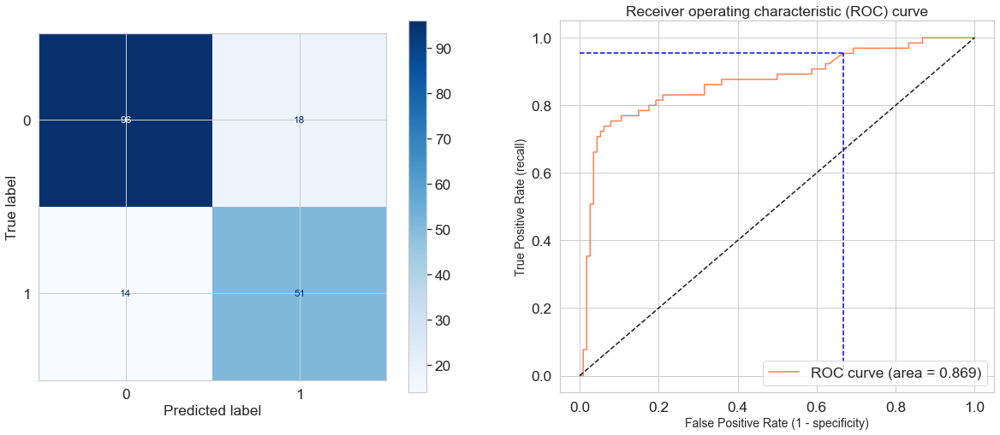

In [99]:
modelo = LogisticRegression()

nome_do_modelo = 'Logistic Regression'

parametros = [{nome_do_modelo+'__penalty': ['l1','l2','elasticnet','none'],
              nome_do_modelo+'__random_state': [42]
}]

best_logistic_regression, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=True)

#### 4.4.2 Decision Tree Classifier

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_

[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.2s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__m

[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42, total=   0.2s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42, total=   0.2s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__

[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42, total=   0.2s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_dept

[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth

[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=25

[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth

[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_dept

[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_dept

[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=gini, Decision Tree Classifier__max_depth=5

[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree C

[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tre

[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=None, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tr

[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Class

[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42, total=   0.2s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=15, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Class

[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifie

[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classi

[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=25, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=10, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Class

[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=auto, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Class

[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=sqrt, Decision Tree Classifier__min_samples_leaf=20, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42, total=   0.1s
[CV] Decision Tree Classifier__criterion=entropy, Decision Tree Classifier__max_depth=50, Decision Tree Classifier__max_features=log2, Decision Tree Classifier__min_samples_leaf=5, Decision Tree Classifier__random_state=42 
[CV]  Decision Tree Classifier__criterion=entropy, Decision Tree Classifi

[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:  1.3min finished


Modelo: Decision Tree Classifier 

Best Parameters: 
 {'Decision Tree Classifier__criterion': 'gini', 'Decision Tree Classifier__max_depth': None, 'Decision Tree Classifier__max_features': 'auto', 'Decision Tree Classifier__min_samples_leaf': 5, 'Decision Tree Classifier__random_state': 42}
Best Model mean of Accuracy score of all folds IN TRAIN: 0.8188023244361272 +- 0.017067331957091557
RESULTS of Decision Tree Classifier 

Results in the TRAIN set:
Accuracy                     :  85.11 %
F1 Score                     :  80.15 %
Precision                    :  83.27 %
Recall                       :  77.26 %


Results in the TEST set:
Accuracy                     :  81.56 %
F1 Score                     :  74.02 %
Precision                    :  75.81 %
Recall                       :  72.31 %




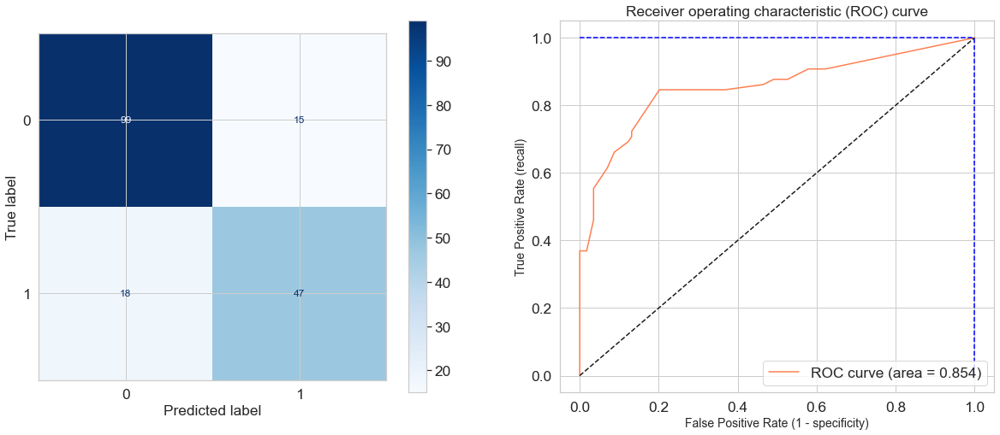

In [100]:
modelo = DecisionTreeClassifier()

nome_do_modelo = 'Decision Tree Classifier'

parametros = [{nome_do_modelo+'__criterion': ['gini','entropy'],
               nome_do_modelo+'__max_depth': [None,15,25,50],
               nome_do_modelo+'__min_samples_leaf': [5,10,20],
               nome_do_modelo+'__max_features': ['auto', 'sqrt', 'log2'],
               nome_do_modelo+'__random_state': [42]
}]

best_DecisionTree, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=True)

#### 4.4.3 Random Forest Classifier

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.3s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.4s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.4s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, 

[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.3s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.4s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=Non

[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.4s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.4s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=No

[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42, total=   0.6s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42, total=   0.5s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=15, Random

[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.3s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.3s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=15, Random For

[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.3s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.5s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random 

[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.4s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.5s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random

[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42, total=   0.7s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42, total=   0.6s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=25, Random

[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.3s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.3s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=50, Random For

[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.4s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.4s
[CV] Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=gini, Random Forest Classifier__max_depth=50, Random

[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.7s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.5s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifie

[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42, total=   0.6s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42, total=   0.9s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifie

[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=None, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42, total=   0.6s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.3s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_de

[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.3s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.3s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth

[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.4s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.5s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=15, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_d

[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.5s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.6s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_d

[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42, total=   0.6s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42, total=   0.6s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_d

[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=25, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=150, Random Forest Classifier__random_state=42, total=   0.6s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.3s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=auto, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_dept

[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.3s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42, total=   0.3s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=sqrt, Random Forest Classifier__n_estimators=50, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth

[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.5s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42, total=   0.4s
[CV] Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_depth=50, Random Forest Classifier__max_features=log2, Random Forest Classifier__n_estimators=100, Random Forest Classifier__random_state=42 
[CV]  Random Forest Classifier__criterion=entropy, Random Forest Classifier__max_d

[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:  3.4min finished


Modelo: Random Forest Classifier 

Best Parameters: 
 {'Random Forest Classifier__criterion': 'entropy', 'Random Forest Classifier__max_depth': 15, 'Random Forest Classifier__max_features': 'auto', 'Random Forest Classifier__n_estimators': 100, 'Random Forest Classifier__random_state': 42}
Best Model mean of Accuracy score of all folds IN TRAIN: 0.8132670146754654 +- 0.024855897039580237
RESULTS of Random Forest Classifier 

Results in the TRAIN set:
Accuracy                     :  97.61 %
F1 Score                     :  96.86 %
Precision                    :  99.24 %
Recall                       :  94.58 %


Results in the TEST set:
Accuracy                     :  84.36 %
F1 Score                     :  78.79 %
Precision                    :  77.61 %
Recall                       :  80.0 %




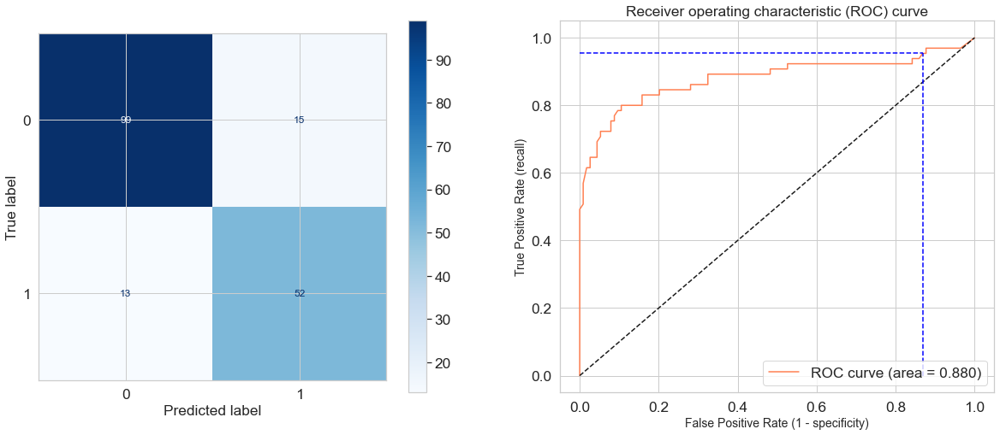

In [101]:
modelo = RandomForestClassifier()

nome_do_modelo = 'Random Forest Classifier'

parametros = [{nome_do_modelo+'__criterion': ['gini','entropy'],
               nome_do_modelo+'__n_estimators': [50,100,150],
               nome_do_modelo+'__max_depth': [None,15,25,50],
               nome_do_modelo+'__max_features': ['auto', 'sqrt', 'log2'],
               nome_do_modelo+'__random_state': [42]
}]

best_RandomForest, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=True)

#### 4.4.4 Extra Trees Classifier

Fitting 5 folds for each of 144 candidates, totalling 720 fits
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.2s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.2s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.2s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra T

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra T

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra 

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.2s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees 

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.6s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.6s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.6s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimat

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.2s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimator

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Ext

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.2s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Ext

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Ext

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Ex

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.2s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, 

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100,

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100,

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100,

[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=False, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150,

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.6s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra T

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.6s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra T

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.7s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.6s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra T

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Cla

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.6s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.6s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Clas

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.6s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classi

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classif

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classif

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extra Trees Classif

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classi

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=gini, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Clas

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=None, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.4s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Ext

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=100, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.7s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Ext

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.7s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.7s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=15, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Ext

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.6s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.8s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Ext

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.6s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.6s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=150, Ext

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.6s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=25, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.5s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=50, Extr

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=auto, Extra Trees Classifier__n_estimators=150, Extra Trees Classifier__random_state=42, total=   0.7s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=sqrt, Extra Trees Classifier__n_estimators=50, Extra 

[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42 
[CV]  Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra Trees Classifier__random_state=42, total=   0.3s
[CV] Extra Trees Classifier__bootstrap=True, Extra Trees Classifier__criterion=entropy, Extra Trees Classifier__max_depth=50, Extra Trees Classifier__max_features=log2, Extra Trees Classifier__n_estimators=50, Extra T

[Parallel(n_jobs=1)]: Done 720 out of 720 | elapsed:  6.4min finished


Modelo: Extra Trees Classifier 

Best Parameters: 
 {'Extra Trees Classifier__bootstrap': True, 'Extra Trees Classifier__criterion': 'gini', 'Extra Trees Classifier__max_depth': 15, 'Extra Trees Classifier__max_features': 'auto', 'Extra Trees Classifier__n_estimators': 50, 'Extra Trees Classifier__random_state': 42}
Best Model mean of Accuracy score of all folds IN TRAIN: 0.814616369545947 +- 0.027154923215698002
RESULTS of Extra Trees Classifier 

Results in the TRAIN set:
Accuracy                     :  96.49 %
F1 Score                     :  95.31 %
Precision                    :  99.22 %
Recall                       :  91.7 %


Results in the TEST set:
Accuracy                     :  83.8 %
F1 Score                     :  77.86 %
Precision                    :  77.27 %
Recall                       :  78.46 %




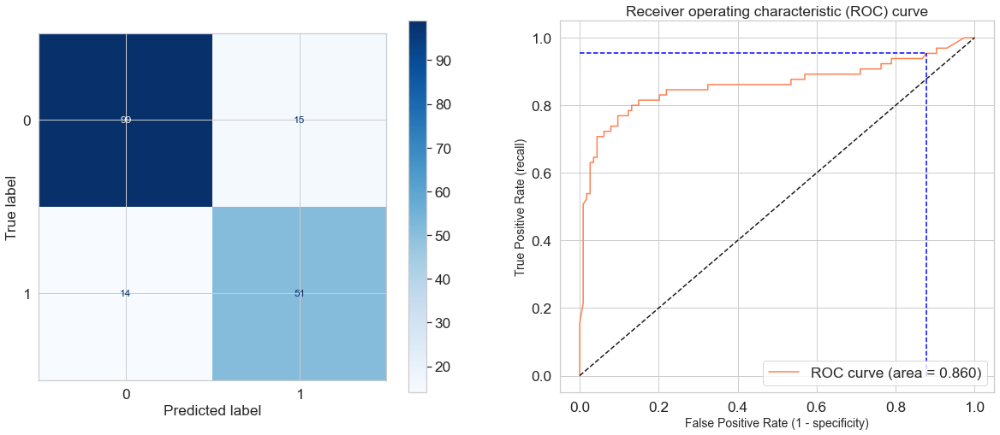

In [114]:
modelo = ExtraTreesClassifier()

nome_do_modelo = 'Extra Trees Classifier'

parametros = [{nome_do_modelo+'__criterion': ['gini','entropy'],
               nome_do_modelo+'__n_estimators': [50,100,150],
               nome_do_modelo+'__max_depth': [None,15,25,50],
               nome_do_modelo+'__max_features': ['auto', 'sqrt', 'log2'],
               nome_do_modelo+'__bootstrap': [False,True],
               nome_do_modelo+'__random_state': [42]
}]

best_ExtraTrees, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=True)

#### 4.4.5 Naive Bayes

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV]  ................................................................
[CV] ................................................. , total=   0.1s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



[CV]  ................................................................
[CV] ................................................. , total=   0.1s
[CV]  ................................................................
[CV] ................................................. , total=   0.1s
[CV]  ................................................................
[CV] ................................................. , total=   0.1s
[CV]  ................................................................
[CV] ................................................. , total=   0.1s
Modelo: Gaussian Naive Bayes Classifier 

Best Parameters: 
 {}
Best Model mean of Accuracy score of all folds IN TRAIN: 0.8230473751600511 +- 0.013415947404581796


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.9s finished


RESULTS of Gaussian Naive Bayes Classifier 

Results in the TRAIN set:
Accuracy                     :  82.44 %
F1 Score                     :  77.8 %
Precision                    :  76.57 %
Recall                       :  79.06 %


Results in the TEST set:
Accuracy                     :  80.45 %
F1 Score                     :  74.45 %
Precision                    :  70.83 %
Recall                       :  78.46 %




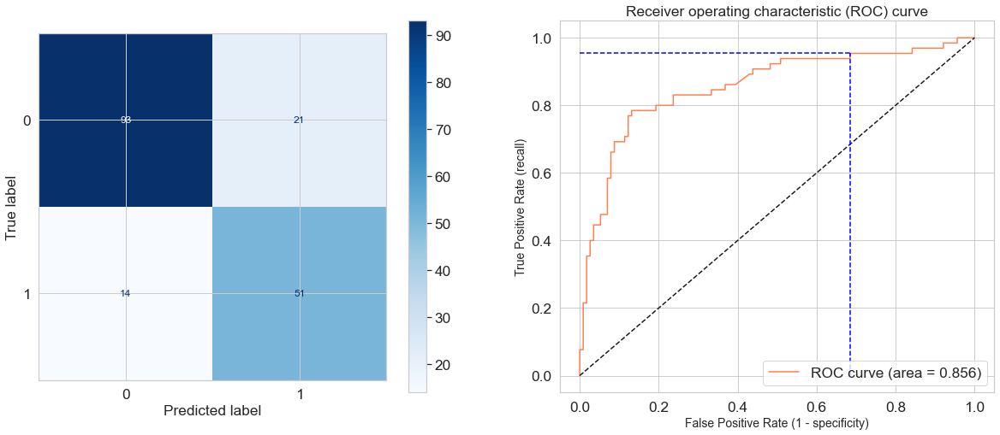

In [102]:
modelo = GaussianNB()

nome_do_modelo = 'Gaussian Naive Bayes Classifier'

parametros = [{}]

best_NaiveBayes, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=True)

#### 4.4.6 Support Vector Machine

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV] Support Vector Machine__C=0.5, Support Vector Machine__degree=2, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  Support Vector Machine__C=0.5, Support Vector Machine__degree=2, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] Support Vector Machine__C=0.5, Support Vector Machine__degree=2, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV]  Support Vector Machine__C=0.5, Support Vector Machine__degree=2, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] Support Vector Machine__C=0.5, Support Vector Machine__degree=2, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42 
[CV]  Support Vector Machine__C=0.5, Support Vector Machine__degree=2, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] Support Vector Machine__C=0.5, Support Vector Machine__degree=2, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42 
[CV]  Support Vector Machine__C=0.5, Support Vector Machine__degree=2, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] 

[CV]  Support Vector Machine__C=0.5, Support Vector Machine__degree=4, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] Support Vector Machine__C=0.5, Support Vector Machine__degree=4, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42 
[CV]  Support Vector Machine__C=0.5, Support Vector Machine__degree=4, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] Support Vector Machine__C=0.5, Support Vector Machine__degree=4, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42 
[CV]  Support Vector Machine__C=0.5, Support Vector Machine__degree=4, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] 

[CV]  Support Vector Machine__C=1, Support Vector Machine__degree=3, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.3s
[CV] Support Vector Machine__C=1, Support Vector Machine__degree=3, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42 
[CV]  Support Vector Machine__C=1, Support Vector Machine__degree=3, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] Support Vector Machine__C=1, Support Vector Machine__degree=3, Support Vector Machine__gamma=auto, Support Vector Machine__probability=True, Support Vector Machine__random_state=42 
[CV]  Support Vector Machine__C=1, Support Vector Machine__degree=3, Support Vector Machine__gamma=auto, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] Support Vect

[CV]  Support Vector Machine__C=1.5, Support Vector Machine__degree=2, Support Vector Machine__gamma=scale, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] Support Vector Machine__C=1.5, Support Vector Machine__degree=2, Support Vector Machine__gamma=auto, Support Vector Machine__probability=True, Support Vector Machine__random_state=42 
[CV]  Support Vector Machine__C=1.5, Support Vector Machine__degree=2, Support Vector Machine__gamma=auto, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] Support Vector Machine__C=1.5, Support Vector Machine__degree=2, Support Vector Machine__gamma=auto, Support Vector Machine__probability=True, Support Vector Machine__random_state=42 
[CV]  Support Vector Machine__C=1.5, Support Vector Machine__degree=2, Support Vector Machine__gamma=auto, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] Supp

[CV]  Support Vector Machine__C=1.5, Support Vector Machine__degree=4, Support Vector Machine__gamma=auto, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] Support Vector Machine__C=1.5, Support Vector Machine__degree=4, Support Vector Machine__gamma=auto, Support Vector Machine__probability=True, Support Vector Machine__random_state=42 
[CV]  Support Vector Machine__C=1.5, Support Vector Machine__degree=4, Support Vector Machine__gamma=auto, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] Support Vector Machine__C=1.5, Support Vector Machine__degree=4, Support Vector Machine__gamma=auto, Support Vector Machine__probability=True, Support Vector Machine__random_state=42 
[CV]  Support Vector Machine__C=1.5, Support Vector Machine__degree=4, Support Vector Machine__gamma=auto, Support Vector Machine__probability=True, Support Vector Machine__random_state=42, total=   0.2s
[CV] Suppo

[Parallel(n_jobs=1)]: Done  90 out of  90 | elapsed:   27.6s finished


RESULTS of Support Vector Machine 

Results in the TRAIN set:
Accuracy                     :  84.13 %
F1 Score                     :  78.39 %
Precision                    :  83.33 %
Recall                       :  74.01 %


Results in the TEST set:
Accuracy                     :  82.68 %
F1 Score                     :  76.34 %
Precision                    :  75.76 %
Recall                       :  76.92 %




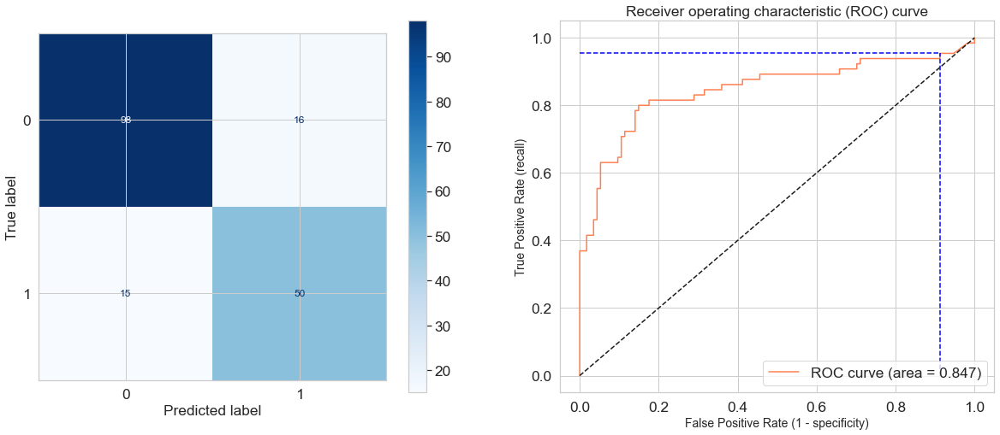

In [103]:
modelo = SVC()

nome_do_modelo = 'Support Vector Machine'

parametros = [{nome_do_modelo+'__degree': [2,3,4],
               nome_do_modelo+'__gamma': ['scale','auto'],
               nome_do_modelo+'__C': [0.5,1,1.5],
               nome_do_modelo+'__probability': [True],
               nome_do_modelo+'__random_state': [42]
}]

best_SVC, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=True)

#### 4.4.7 Ridge Classifier

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] Ridge Classifier__random_state=42 ...............................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................ Ridge Classifier__random_state=42, total=   0.2s
[CV] Ridge Classifier__random_state=42 ...............................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV] ................ Ridge Classifier__random_state=42, total=   0.1s
[CV] Ridge Classifier__random_state=42 ...............................
[CV] ................ Ridge Classifier__random_state=42, total=   0.2s
[CV] Ridge Classifier__random_state=42 ...............................
[CV] ................ Ridge Classifier__random_state=42, total=   0.2s
[CV] Ridge Classifier__random_state=42 ...............................
[CV] ................ Ridge Classifier__random_state=42, total=   0.2s
Modelo: Ridge Classifier 

Best Parameters: 
 {'Ridge Classifier__random_state': 42}
Best Model mean of Accuracy score of all folds IN TRAIN: 0.8286417807544568 +- 0.007368807880834403


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.6s finished


RESULTS of Ridge Classifier 

Results in the TRAIN set:
Accuracy                     :  83.29 %
F1 Score                     :  77.59 %
Precision                    :  81.1 %
Recall                       :  74.37 %


Results in the TEST set:
Accuracy                     :  82.12 %
F1 Score                     :  75.76 %
Precision                    :  74.63 %
Recall                       :  76.92 %




UnboundLocalError: local variable 'y_pred_proba' referenced before assignment

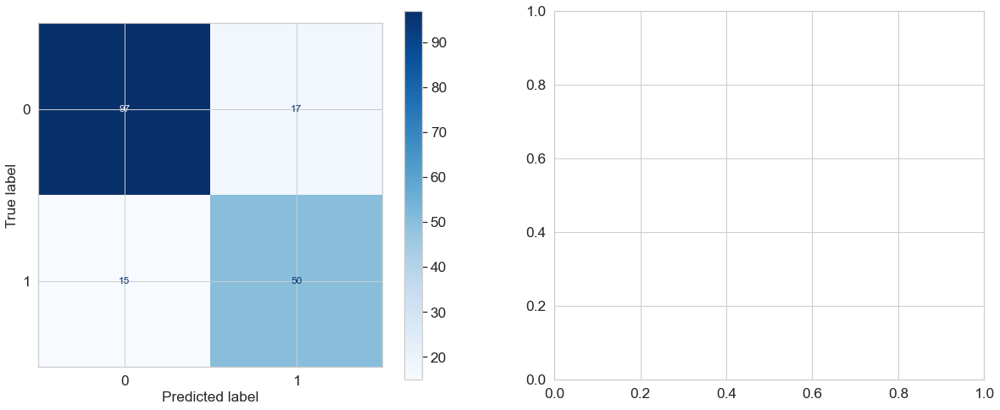

In [109]:
modelo = RidgeClassifier()

nome_do_modelo = 'Ridge Classifier'

parametros = [{nome_do_modelo+'__random_state': [42]}]

best_Ridge, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=True)

#### 4.4.8 AdaBoost

Fitting 5 folds for each of 15 candidates, totalling 75 fits
[CV] Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=RandomForestClassifier(), Ada Boost Classifier__n_estimators=50, Ada Boost Classifier__random_state=42 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=RandomForestClassifier(), Ada Boost Classifier__n_estimators=50, Ada Boost Classifier__random_state=42, total=   2.2s
[CV] Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=RandomForestClassifier(), Ada Boost Classifier__n_estimators=50, Ada Boost Classifier__random_state=42 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.3s remaining:    0.0s


[CV]  Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=RandomForestClassifier(), Ada Boost Classifier__n_estimators=50, Ada Boost Classifier__random_state=42, total=   3.9s
[CV] Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=RandomForestClassifier(), Ada Boost Classifier__n_estimators=50, Ada Boost Classifier__random_state=42 
[CV]  Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=RandomForestClassifier(), Ada Boost Classifier__n_estimators=50, Ada Boost Classifier__random_state=42, total=   4.7s
[CV] Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=RandomForestClassifier(), Ada Boost Classifier__n_estimators=50, Ada Boost Classifier__random_state=42 
[CV]  Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=RandomForestClassifier(), Ada Boost Classifier__n_estimators=50, Ada Boost Classifier__random_state=42, total=   2.9s
[CV] Ada Boost Classifier__alg

[CV]  Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=DecisionTreeClassifier(), Ada Boost Classifier__n_estimators=100, Ada Boost Classifier__random_state=42, total=   0.6s
[CV] Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=DecisionTreeClassifier(), Ada Boost Classifier__n_estimators=100, Ada Boost Classifier__random_state=42 
[CV]  Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=DecisionTreeClassifier(), Ada Boost Classifier__n_estimators=100, Ada Boost Classifier__random_state=42, total=   0.6s
[CV] Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=DecisionTreeClassifier(), Ada Boost Classifier__n_estimators=150, Ada Boost Classifier__random_state=42 
[CV]  Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=DecisionTreeClassifier(), Ada Boost Classifier__n_estimators=150, Ada Boost Classifier__random_state=42, total=   0.8s
[CV] Ada Boost Classifier

[CV]  Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=LogisticRegression(), Ada Boost Classifier__n_estimators=50, Ada Boost Classifier__random_state=42, total=   0.2s
[CV] Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=LogisticRegression(), Ada Boost Classifier__n_estimators=50, Ada Boost Classifier__random_state=42 
[CV]  Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=LogisticRegression(), Ada Boost Classifier__n_estimators=50, Ada Boost Classifier__random_state=42, total=   0.2s
[CV] Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=LogisticRegression(), Ada Boost Classifier__n_estimators=50, Ada Boost Classifier__random_state=42 
[CV]  Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=LogisticRegression(), Ada Boost Classifier__n_estimators=50, Ada Boost Classifier__random_state=42, total=   0.4s
[CV] Ada Boost Classifier__algorithm=SAMME, Ada Bo

[CV]  Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=ExtraTreesClassifier(), Ada Boost Classifier__n_estimators=100, Ada Boost Classifier__random_state=42, total=  31.3s
[CV] Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=ExtraTreesClassifier(), Ada Boost Classifier__n_estimators=100, Ada Boost Classifier__random_state=42 
[CV]  Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=ExtraTreesClassifier(), Ada Boost Classifier__n_estimators=100, Ada Boost Classifier__random_state=42, total=  33.0s
[CV] Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=ExtraTreesClassifier(), Ada Boost Classifier__n_estimators=150, Ada Boost Classifier__random_state=42 
[CV]  Ada Boost Classifier__algorithm=SAMME, Ada Boost Classifier__base_estimator=ExtraTreesClassifier(), Ada Boost Classifier__n_estimators=150, Ada Boost Classifier__random_state=42, total=  52.1s
[CV] Ada Boost Classifier__algorith

[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:  9.8min finished


Modelo: Ada Boost Classifier 

Best Parameters: 
 {'Ada Boost Classifier__algorithm': 'SAMME', 'Ada Boost Classifier__base_estimator': LogisticRegression(), 'Ada Boost Classifier__n_estimators': 50, 'Ada Boost Classifier__random_state': 42}
Best Model mean of Accuracy score of all folds IN TRAIN: 0.8272530286614794 +- 0.0053900454386243465
RESULTS of Ada Boost Classifier 

Results in the TRAIN set:
Accuracy                     :  81.32 %
F1 Score                     :  74.07 %
Precision                    :  80.51 %
Recall                       :  68.59 %


Results in the TEST set:
Accuracy                     :  82.12 %
F1 Score                     :  75.76 %
Precision                    :  74.63 %
Recall                       :  76.92 %




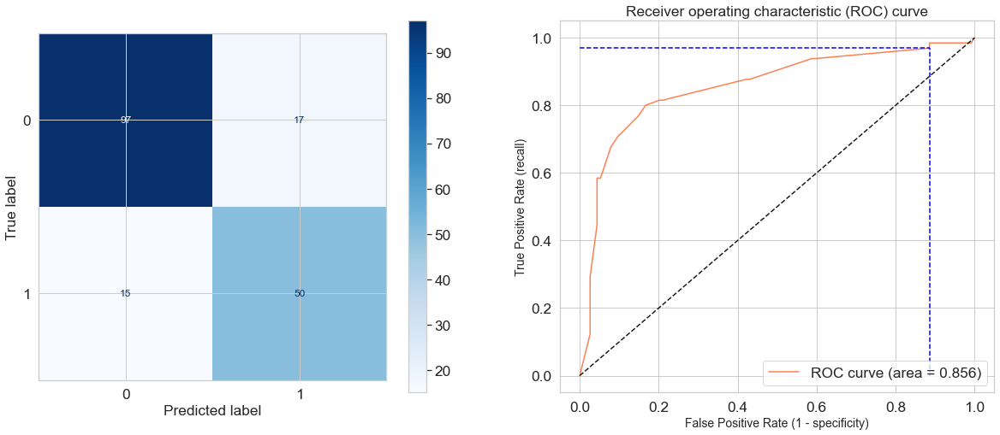

In [123]:
modelo = AdaBoostClassifier()

nome_do_modelo = 'Ada Boost Classifier'

parametros = [{nome_do_modelo+'__base_estimator': [RandomForestClassifier(),DecisionTreeClassifier(),SVC(),LogisticRegression(),ExtraTreesClassifier()],
               nome_do_modelo+'__algorithm': ['SAMME'],
               nome_do_modelo+'__n_estimators': [50,100,150],
               nome_do_modelo+'__random_state': [42]
              }]

best_AdaBoost, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=True)

#### 4.4.9 SGD Classifier

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] SGD Classifier__loss=log, SGD Classifier__penalty=l2, SGD Classifier__random_state=42 
[CV]  SGD Classifier__loss=log, SGD Classifier__penalty=l2, SGD Classifier__random_state=42, total=   0.1s
[CV] SGD Classifier__loss=log, SGD Classifier__penalty=l2, SGD Classifier__random_state=42 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV]  SGD Classifier__loss=log, SGD Classifier__penalty=l2, SGD Classifier__random_state=42, total=   0.1s
[CV] SGD Classifier__loss=log, SGD Classifier__penalty=l2, SGD Classifier__random_state=42 
[CV]  SGD Classifier__loss=log, SGD Classifier__penalty=l2, SGD Classifier__random_state=42, total=   0.1s
[CV] SGD Classifier__loss=log, SGD Classifier__penalty=l2, SGD Classifier__random_state=42 
[CV]  SGD Classifier__loss=log, SGD Classifier__penalty=l2, SGD Classifier__random_state=42, total=   0.1s
[CV] SGD Classifier__loss=log, SGD Classifier__penalty=l2, SGD Classifier__random_state=42 
[CV]  SGD Classifier__loss=log, SGD Classifier__penalty=l2, SGD Classifier__random_state=42, total=   0.1s
[CV] SGD Classifier__loss=log, SGD Classifier__penalty=l1, SGD Classifier__random_state=42 
[CV]  SGD Classifier__loss=log, SGD Classifier__penalty=l1, SGD Classifier__random_state=42, total=   0.1s
[CV] SGD Classifier__loss=log, SGD Classifier__penalty=l1, SGD Classifier__random_state=42 
[CV] 

[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:    2.4s finished


RESULTS of SGD Classifier 

Results in the TRAIN set:
Accuracy                     :  81.32 %
F1 Score                     :  74.57 %
Precision                    :  79.27 %
Recall                       :  70.4 %


Results in the TEST set:
Accuracy                     :  78.21 %
F1 Score                     :  69.77 %
Precision                    :  70.31 %
Recall                       :  69.23 %




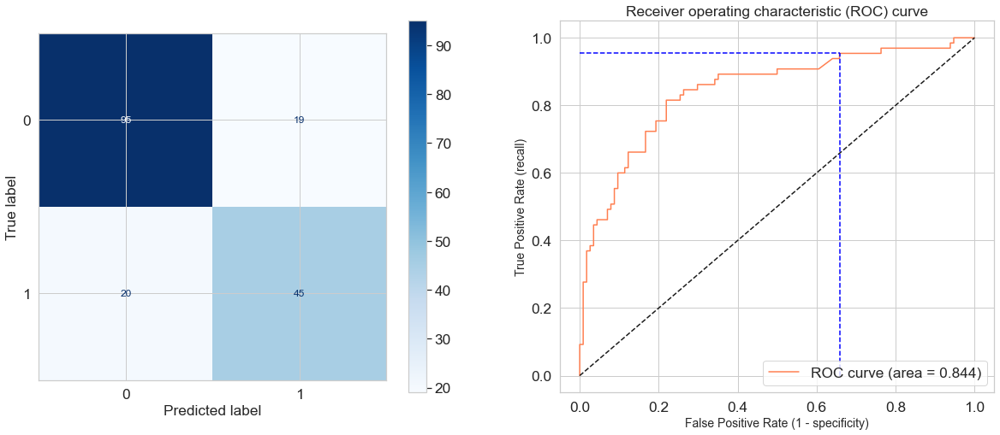

In [128]:
modelo = SGDClassifier()

nome_do_modelo = 'SGD Classifier'

parametros = [{nome_do_modelo+'__penalty': ['l2','l1','elasticnet'],
               nome_do_modelo+'__loss': ['log'],
               nome_do_modelo+'__random_state': [42]
              }]

best_SGDC, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=True)

#### 4.4.10 MLPClassifier - Neural Network

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] Neural Network - MLP Classifier__learning_rate=constant, Neural Network - MLP Classifier__solver=lbfgs 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  Neural Network - MLP Classifier__learning_rate=constant, Neural Network - MLP Classifier__solver=lbfgs, total=   0.9s
[CV] Neural Network - MLP Classifier__learning_rate=constant, Neural Network - MLP Classifier__solver=lbfgs 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s


[CV]  Neural Network - MLP Classifier__learning_rate=constant, Neural Network - MLP Classifier__solver=lbfgs, total=   1.1s
[CV] Neural Network - MLP Classifier__learning_rate=constant, Neural Network - MLP Classifier__solver=lbfgs 
[CV]  Neural Network - MLP Classifier__learning_rate=constant, Neural Network - MLP Classifier__solver=lbfgs, total=   1.5s
[CV] Neural Network - MLP Classifier__learning_rate=constant, Neural Network - MLP Classifier__solver=lbfgs 
[CV]  Neural Network - MLP Classifier__learning_rate=constant, Neural Network - MLP Classifier__solver=lbfgs, total=   1.3s
[CV] Neural Network - MLP Classifier__learning_rate=constant, Neural Network - MLP Classifier__solver=lbfgs 
[CV]  Neural Network - MLP Classifier__learning_rate=constant, Neural Network - MLP Classifier__solver=lbfgs, total=   1.2s
[CV] Neural Network - MLP Classifier__learning_rate=constant, Neural Network - MLP Classifier__solver=sgd 
[CV]  Neural Network - MLP Classifier__learning_rate=constant, Neural 

[CV]  Neural Network - MLP Classifier__learning_rate=adaptative, Neural Network - MLP Classifier__solver=sgd, total=   0.1s
[CV] Neural Network - MLP Classifier__learning_rate=adaptative, Neural Network - MLP Classifier__solver=sgd 
[CV]  Neural Network - MLP Classifier__learning_rate=adaptative, Neural Network - MLP Classifier__solver=sgd, total=   0.1s
[CV] Neural Network - MLP Classifier__learning_rate=adaptative, Neural Network - MLP Classifier__solver=adam 
[CV]  Neural Network - MLP Classifier__learning_rate=adaptative, Neural Network - MLP Classifier__solver=adam, total=   0.1s
[CV] Neural Network - MLP Classifier__learning_rate=adaptative, Neural Network - MLP Classifier__solver=adam 
[CV]  Neural Network - MLP Classifier__learning_rate=adaptative, Neural Network - MLP Classifier__solver=adam, total=   0.1s
[CV] Neural Network - MLP Classifier__learning_rate=adaptative, Neural Network - MLP Classifier__solver=adam 
[CV]  Neural Network - MLP Classifier__learning_rate=adaptative

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   42.6s finished


Modelo: Neural Network - MLP Classifier 

Best Parameters: 
 {'Neural Network - MLP Classifier__learning_rate': 'constant', 'Neural Network - MLP Classifier__solver': 'sgd'}
Best Model mean of Accuracy score of all folds IN TRAIN: 0.8314783807741554 +- 0.01577417878379982
RESULTS of Neural Network - MLP Classifier 

Results in the TRAIN set:
Accuracy                     :  83.71 %
F1 Score                     :  78.44 %
Precision                    :  80.84 %
Recall                       :  76.17 %


Results in the TEST set:
Accuracy                     :  82.12 %
F1 Score                     :  75.76 %
Precision                    :  74.63 %
Recall                       :  76.92 %




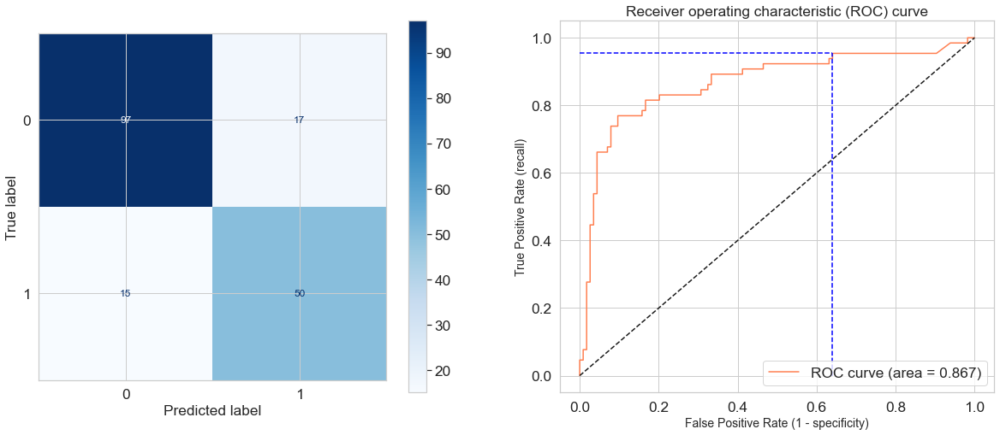

In [130]:
modelo = MLPClassifier()

nome_do_modelo = 'Neural Network - MLP Classifier'

parametros = [{nome_do_modelo+'__solver': ['lbfgs', 'sgd', 'adam'],
               nome_do_modelo+'__learning_rate': ['constant','invscaling','adaptative']
              }]

best_MLP, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=True)

#### 4.4.11 Gradient Boosting Classifier

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] Gradient Boosting Classifier__max_features=auto, Gradient Boosting Classifier__n_estimators=50, Gradient Boosting Classifier__random_state=42 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  Gradient Boosting Classifier__max_features=auto, Gradient Boosting Classifier__n_estimators=50, Gradient Boosting Classifier__random_state=42, total=   0.2s
[CV] Gradient Boosting Classifier__max_features=auto, Gradient Boosting Classifier__n_estimators=50, Gradient Boosting Classifier__random_state=42 
[CV]  Gradient Boosting Classifier__max_features=auto, Gradient Boosting Classifier__n_estimators=50, Gradient Boosting Classifier__random_state=42, total=   0.2s

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s



[CV] Gradient Boosting Classifier__max_features=auto, Gradient Boosting Classifier__n_estimators=50, Gradient Boosting Classifier__random_state=42 
[CV]  Gradient Boosting Classifier__max_features=auto, Gradient Boosting Classifier__n_estimators=50, Gradient Boosting Classifier__random_state=42, total=   0.2s
[CV] Gradient Boosting Classifier__max_features=auto, Gradient Boosting Classifier__n_estimators=50, Gradient Boosting Classifier__random_state=42 
[CV]  Gradient Boosting Classifier__max_features=auto, Gradient Boosting Classifier__n_estimators=50, Gradient Boosting Classifier__random_state=42, total=   0.2s
[CV] Gradient Boosting Classifier__max_features=auto, Gradient Boosting Classifier__n_estimators=50, Gradient Boosting Classifier__random_state=42 
[CV]  Gradient Boosting Classifier__max_features=auto, Gradient Boosting Classifier__n_estimators=50, Gradient Boosting Classifier__random_state=42, total=   0.2s
[CV] Gradient Boosting Classifier__max_features=auto, Gradient Boo

[CV]  Gradient Boosting Classifier__max_features=sqrt, Gradient Boosting Classifier__n_estimators=150, Gradient Boosting Classifier__random_state=42, total=   0.3s
[CV] Gradient Boosting Classifier__max_features=sqrt, Gradient Boosting Classifier__n_estimators=150, Gradient Boosting Classifier__random_state=42 
[CV]  Gradient Boosting Classifier__max_features=sqrt, Gradient Boosting Classifier__n_estimators=150, Gradient Boosting Classifier__random_state=42, total=   0.4s
[CV] Gradient Boosting Classifier__max_features=log2, Gradient Boosting Classifier__n_estimators=50, Gradient Boosting Classifier__random_state=42 
[CV]  Gradient Boosting Classifier__max_features=log2, Gradient Boosting Classifier__n_estimators=50, Gradient Boosting Classifier__random_state=42, total=   0.2s
[CV] Gradient Boosting Classifier__max_features=log2, Gradient Boosting Classifier__n_estimators=50, Gradient Boosting Classifier__random_state=42 
[CV]  Gradient Boosting Classifier__max_features=log2, Gradient 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   15.7s finished


Modelo: Gradient Boosting Classifier 

Best Parameters: 
 {'Gradient Boosting Classifier__max_features': 'auto', 'Gradient Boosting Classifier__n_estimators': 100, 'Gradient Boosting Classifier__random_state': 42}
Best Model mean of Accuracy score of all folds IN TRAIN: 0.837082635674185 +- 0.009250978330697364
RESULTS of Gradient Boosting Classifier 

Results in the TRAIN set:
Accuracy                     :  90.17 %
F1 Score                     :  87.23 %
Precision                    :  88.19 %
Recall                       :  86.28 %


Results in the TEST set:
Accuracy                     :  83.8 %
F1 Score                     :  78.2 %
Precision                    :  76.47 %
Recall                       :  80.0 %




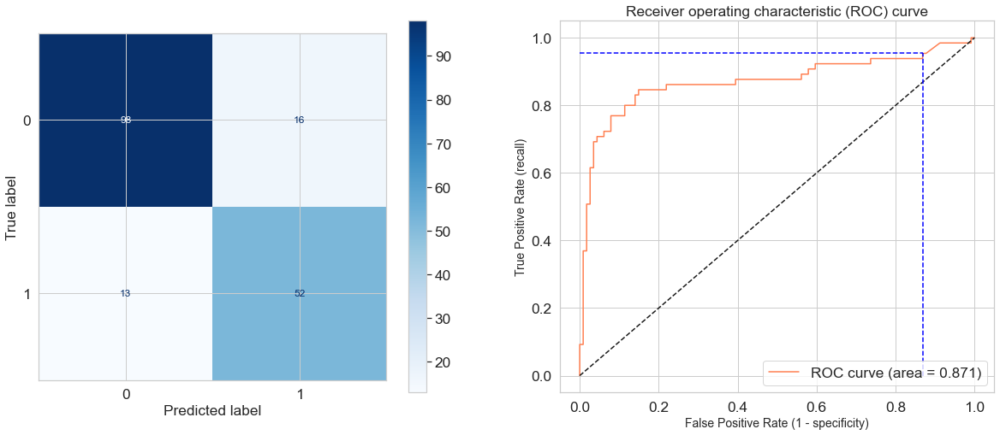

In [132]:
modelo = GradientBoostingClassifier()

nome_do_modelo = 'Gradient Boosting Classifier'

parametros = [{nome_do_modelo+'__n_estimators': [50,100,150],
               nome_do_modelo+'__max_features': ['auto','sqrt','log2'],
               nome_do_modelo+'__random_state': [42]
              }]

best_GradientBoost, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=True)

#### 4.4.12 Voting Classifier (With ALL Models built so far)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] Voting Classifier with ALL models__voting=soft ..................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ... Voting Classifier with ALL models__voting=soft, total=   2.2s
[CV] Voting Classifier with ALL models__voting=soft ..................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.4s remaining:    0.0s


[CV] ... Voting Classifier with ALL models__voting=soft, total=   2.4s
[CV] Voting Classifier with ALL models__voting=soft ..................
[CV] ... Voting Classifier with ALL models__voting=soft, total=   2.3s
[CV] Voting Classifier with ALL models__voting=soft ..................
[CV] ... Voting Classifier with ALL models__voting=soft, total=   2.5s
[CV] Voting Classifier with ALL models__voting=soft ..................
[CV] ... Voting Classifier with ALL models__voting=soft, total=   2.2s


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   12.4s finished


Modelo: Voting Classifier with ALL models 

Best Parameters: 
 {'Voting Classifier with ALL models__voting': 'soft'}
Best Model mean of Accuracy score of all folds IN TRAIN: 0.825844577957254 +- 0.010246573048078616
RESULTS of Voting Classifier with ALL models 

Results in the TRAIN set:
Accuracy                     :  86.1 %
F1 Score                     :  81.83 %
Precision                    :  83.21 %
Recall                       :  80.51 %


Results in the TEST set:
Accuracy                     :  82.68 %
F1 Score                     :  77.37 %
Precision                    :  73.61 %
Recall                       :  81.54 %




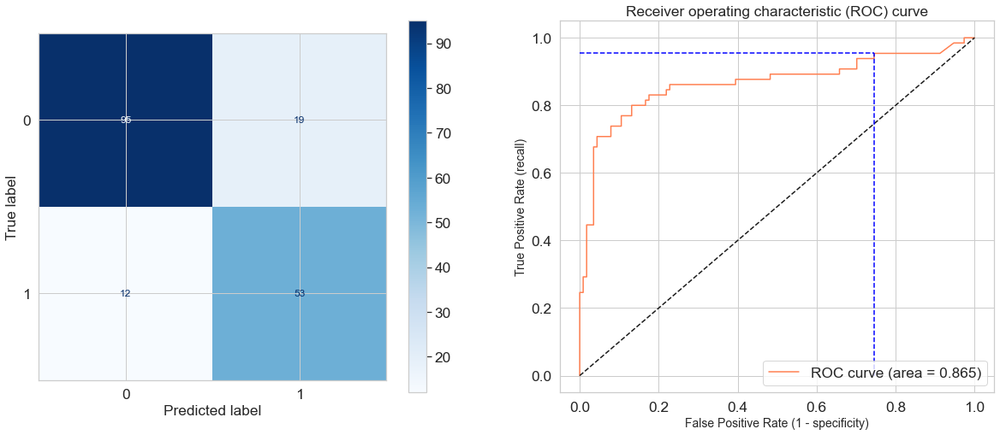

In [151]:
LR = LogisticRegression(penalty='l2',random_state=42)
DTC = DecisionTreeClassifier(criterion='gini',max_depth=None,max_features='auto',min_samples_leaf=5,random_state=42)
RFC = RandomForestClassifier(criterion='entropy',max_depth=15,max_features='auto',n_estimators=100,random_state=42)
ETC = ExtraTreesClassifier(bootstrap=True,criterion='gini',max_depth=15,max_features='auto',n_estimators=50,random_state=42)
GNB = GaussianNB()
ABC = AdaBoostClassifier(algorithm='SAMME',base_estimator=LogisticRegression(),n_estimators=50,random_state=42)
SGD = SGDClassifier(loss='log',penalty='l1',random_state=42)
MLP = MLPClassifier(learning_rate='constant',solver='sgd')
GBC = GradientBoostingClassifier(max_features='auto',n_estimators=100,random_state=42)

modelo = VotingClassifier(estimators=[('Logistic Regression',LR),
                                               ('Decision Tree Classifier',DTC),
                                               ('Random Forest Classifier',RFC),
                                               ('Extra Trees Classifier',ETC),
                                               ('Gaussian Naive Bayes Classifier',GNB),
                                               ('Ada Boost Classifier',ABC),
                                               ('SGD Classifier',SGD),
                                               ('Neural Network - MLP Classifier',MLP),
                                               ('Gradient Boosting Classifier',GBC)])

nome_do_modelo = 'Voting Classifier with ALL models'

parametros = [{nome_do_modelo+'__voting': ['soft']}]

best_VotingClassifier1, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=True)

#### 4.4.13 Voting Classifier (With the TOP 3 Models so far)

##### 4.4.13.1 Pipeline with replacement of null Ages by the mean

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] Voting Classifier with TOP 3 models__voting=soft ................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] . Voting Classifier with TOP 3 models__voting=soft, total=   0.5s
[CV] Voting Classifier with TOP 3 models__voting=soft ................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV] . Voting Classifier with TOP 3 models__voting=soft, total=   0.5s
[CV] Voting Classifier with TOP 3 models__voting=soft ................
[CV] . Voting Classifier with TOP 3 models__voting=soft, total=   0.5s
[CV] Voting Classifier with TOP 3 models__voting=soft ................
[CV] . Voting Classifier with TOP 3 models__voting=soft, total=   0.5s
[CV] Voting Classifier with TOP 3 models__voting=soft ................
[CV] . Voting Classifier with TOP 3 models__voting=soft, total=   0.7s


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    3.1s finished


Modelo: Voting Classifier with TOP 3 models 

Best Parameters: 
 {'Voting Classifier with TOP 3 models__voting': 'soft'}
Best Model mean of Accuracy score of all folds IN TRAIN: 0.8244755244755245 +- 0.017955513770027565
RESULTS of Voting Classifier with TOP 3 models 

Results in the TRAIN set:
Accuracy                     :  95.65 %
F1 Score                     :  94.21 %
Precision                    :  97.67 %
Recall                       :  90.97 %


Results in the TEST set:
Accuracy                     :  84.92 %
F1 Score                     :  79.7 %
Precision                    :  77.94 %
Recall                       :  81.54 %




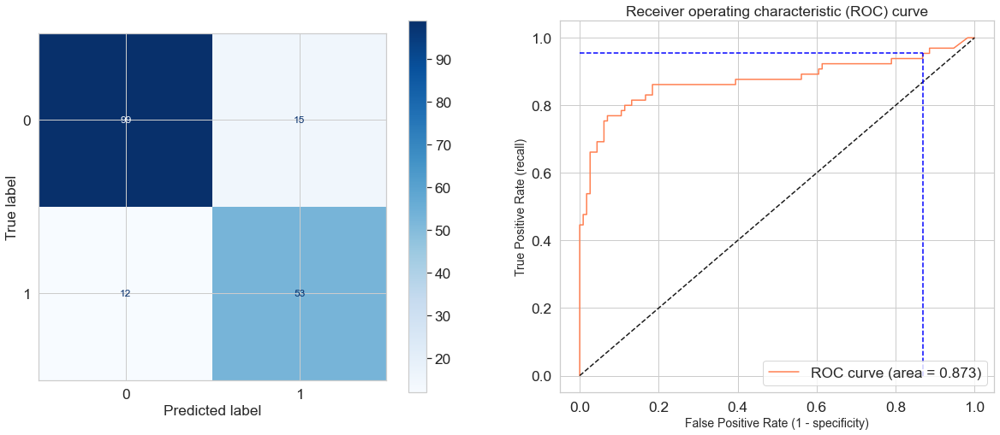

In [152]:
RFC = RandomForestClassifier(criterion='entropy',max_depth=15,max_features='auto',n_estimators=100,random_state=42)
ETC = ExtraTreesClassifier(bootstrap=True,criterion='gini',max_depth=15,max_features='auto',n_estimators=50,random_state=42)
GBC = GradientBoostingClassifier(max_features='auto',n_estimators=100,random_state=42)

modelo = VotingClassifier(estimators=[('Random Forest Classifier',RFC),
                                      ('Extra Trees Classifier',ETC),
                                      ('Gradient Boosting Classifier',GBC)])

nome_do_modelo = 'Voting Classifier with TOP 3 models'

parametros = [{nome_do_modelo+'__voting': ['soft']}]

best_VotingClassifier2, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=True)

##### 4.4.13.2 Pipeline with replacement of null Ages by the median

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] Voting Classifier with TOP 3 models__voting=soft ................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] . Voting Classifier with TOP 3 models__voting=soft, total=   0.5s
[CV] Voting Classifier with TOP 3 models__voting=soft ................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV] . Voting Classifier with TOP 3 models__voting=soft, total=   0.5s
[CV] Voting Classifier with TOP 3 models__voting=soft ................
[CV] . Voting Classifier with TOP 3 models__voting=soft, total=   0.6s
[CV] Voting Classifier with TOP 3 models__voting=soft ................
[CV] . Voting Classifier with TOP 3 models__voting=soft, total=   0.7s
[CV] Voting Classifier with TOP 3 models__voting=soft ................
[CV] . Voting Classifier with TOP 3 models__voting=soft, total=   0.7s


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    3.4s finished


Modelo: Voting Classifier with TOP 3 models 

Best Parameters: 
 {'Voting Classifier with TOP 3 models__voting': 'soft'}
Best Model mean of Accuracy score of all folds IN TRAIN: 0.8202403230572244 +- 0.02094584929709028
RESULTS of Voting Classifier with TOP 3 models 

Results in the TRAIN set:
Accuracy                     :  95.51 %
F1 Score                     :  94.01 %
Precision                    :  97.67 %
Recall                       :  90.61 %


Results in the TEST set:
Accuracy                     :  84.92 %
F1 Score                     :  79.7 %
Precision                    :  77.94 %
Recall                       :  81.54 %




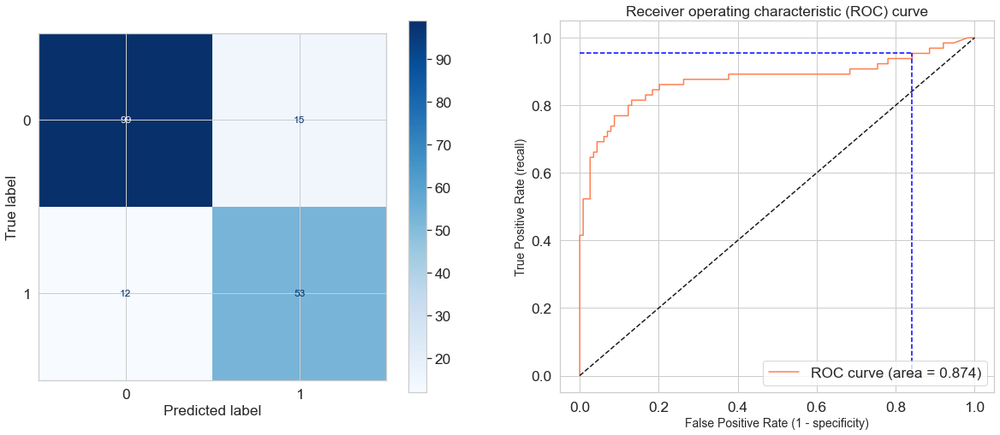

In [153]:
RFC = RandomForestClassifier(criterion='entropy',max_depth=15,max_features='auto',n_estimators=100,random_state=42)
ETC = ExtraTreesClassifier(bootstrap=True,criterion='gini',max_depth=15,max_features='auto',n_estimators=50,random_state=42)
GBC = GradientBoostingClassifier(max_features='auto',n_estimators=100,random_state=42)

modelo = VotingClassifier(estimators=[('Random Forest Classifier',RFC),
                                      ('Extra Trees Classifier',ETC),
                                      ('Gradient Boosting Classifier',GBC)])

nome_do_modelo = 'Voting Classifier with TOP 3 models'

parametros = [{nome_do_modelo+'__voting': ['soft']}]

best_VotingClassifier2, y_train_pred, y_test_pred = modelling_evaluating(modelo, nome_do_modelo, parametros, pipeline_mean=False)

### 5. Results and Discussion